In [123]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import joblib
import cv2

In [19]:
INPUT_METADATA_DIR = '/kaggle/input/ticktickbloomdataset'

metadata = pd.read_csv(os.path.join(INPUT_METADATA_DIR, 'metadata.csv'))
sub_format = pd.read_csv(os.path.join(INPUT_METADATA_DIR, 'submission_format.csv'))
train_labels = pd.read_csv(os.path.join(INPUT_METADATA_DIR, 'train_labels.csv'))

In [87]:
metadata.date = pd.to_datetime(metadata.date)
metadata = pd.merge(metadata, train_labels, how='left', on='uid')

In [45]:
part_1 = '/kaggle/input/pull-sentinel-sr-v0-part-1'
part_2 = '/kaggle/input/pull-sentinel-sr-v0-part-2'

sent_1 = os.path.join(part_1, 'sentinel-l1c_500m_v0')
sent_2 = os.path.join(part_2, "sentinel-l1c_500m_v0")

err_1 = joblib.load(os.path.join(part_1, 'errors-p1.joblib'))
err_2 = joblib.load(os.path.join(part_2, 'errors-p2.joblib'))

imgs_not_found1 =  joblib.load(os.path.join(part_1, 'imgs_not_found_in_col-p1.joblib'))
imgs_not_found2 = joblib.load(os.path.join(part_2, 'imgs_not_found_in_col-p2.joblib'))

missed_imgs_1 = joblib.load(os.path.join(part_1, 'missed_imgs-p1.joblib'))
missed_imgs_2 = joblib.load(os.path.join(part_2, 'missed_imgs-p2.joblib'))

In [10]:
err_1,  err_2 # no errrors except for bounding boxx ones! --> good

([], [])

In [14]:
missed_imgs = missed_imgs_1 + missed_imgs_2
len(missed_imgs)

0

In [13]:
len(imgs_not_found1)

1544

In [12]:
imgs_not_found = imgs_not_found1 + imgs_not_found2
len(imgs_not_found)

1544

In [88]:
#  so only part1 has missing imgs! and what are those??

nt_found_df = metadata[metadata.uid.isin(imgs_not_found)]
nt_found_df

,uid,latitude,longitude,date,split,region,severity,density
11,aaig,35.896233,-79.047705,2015-08-24,train,south,3.0,199930.0
14,aajw,40.703968,-80.293050,2015-08-26,test,NaN,NaN,NaN
17,aamg,37.971800,-121.374000,2015-08-18,train,west,4.0,1720200.0
19,aaoj,38.020100,-122.259000,2015-07-07,train,west,4.0,4080000.0
38,abau,35.682235,-79.207716,2016-06-21,train,south,2.0,23236.0
...,...,...,...,...,...,...,...,...
23532,zyvp,35.634036,-79.297241,2015-07-23,train,south,1.0,3167.0
23549,zzio,35.652560,-79.262835,2015-07-07,train,south,1.0,13232.0
23554,zzny,36.150710,-78.860786,2015-09-01,train,south,3.0,437862.0
23564,zzuq,35.794000,-79.015368,2015-08-06,train,south,3.0,175726.0


In [89]:
nt_found_df.split.value_counts()

train    1246
test      298
Name: split, dtype: int64

In [90]:
nt_found_df.sort_values(by='date').head(20)

,uid,latitude,longitude,date,split,region,severity,density
16719,skny,41.693325,-80.077080,2015-06-23,test,NaN,NaN,NaN
21986,ygaq,41.697470,-80.106079,2015-06-23,test,NaN,NaN,NaN
23035,zkaa,41.697351,-80.100017,2015-06-23,test,NaN,NaN,NaN
5831,gkua,41.353881,-80.754718,2015-06-24,test,NaN,NaN,NaN
12064,nhfy,41.482828,-80.746954,2015-06-24,test,NaN,NaN,NaN
881,azmp,41.300686,-80.758190,2015-06-24,test,NaN,NaN,NaN
19390,viue,41.388596,-80.750147,2015-06-24,test,NaN,NaN,NaN
13249,opdc,41.314300,-80.745838,2015-06-24,test,NaN,NaN,NaN
13128,omev,41.299298,-80.758329,2015-06-24,test,NaN,NaN,NaN
14818,qhps,41.507500,-72.222000,2015-06-25,test,NaN,NaN,NaN


In [91]:
nt_found_df.sort_values(by='date').tail(20)

,uid,latitude,longitude,date,split,region,severity,density
7238,hzon,35.711964,-79.152498,2016-06-22,train,south,1.0,1936.0
16955,sqsi,35.710287,-79.155612,2016-06-22,train,south,2.0,35647.0
2444,cspc,35.710314,-79.155563,2016-06-22,train,south,1.0,5281.0
6480,hely,35.705869,-79.163818,2016-06-22,train,south,1.0,94.0
5289,fved,35.712097,-79.152251,2016-06-22,train,south,1.0,5083.0
6889,hppe,35.654360,-79.007686,2016-06-22,train,south,2.0,67934.0
17872,tqyl,35.654360,-79.007438,2016-06-22,train,south,2.0,43568.0
5959,gosz,35.705975,-79.163621,2016-06-22,train,south,1.0,5083.0
18151,tzpd,35.706029,-79.163522,2016-06-22,train,south,1.0,498.0
18157,tzsr,35.505830,-79.097429,2016-06-22,train,south,3.0,371057.0


In [92]:
nt_found_df.date.dt.year.value_counts()  

2015    1242
2016     302
Name: date, dtype: int64

In [93]:
nt_found_df.date.dt.month.value_counts()  

7     413
8     384
9     285
6     206
10    102
4      95
3      33
11     13
1       7
5       4
12      2
Name: date, dtype: int64

In [94]:
#  is all data btween 2015-06-23 and  2016-07-18 is missing?

start = '2015-06-23'
end = '2016-07-18'

st_filter = metadata.date >= start 
end_filter = metadata.date <= end

metadata[st_filter & end_filter]

,uid,latitude,longitude,date,split,region,severity,density
11,aaig,35.896233,-79.047705,2015-08-24,train,south,3.0,199930.0
14,aajw,40.703968,-80.293050,2015-08-26,test,NaN,NaN,NaN
17,aamg,37.971800,-121.374000,2015-08-18,train,west,4.0,1720200.0
19,aaoj,38.020100,-122.259000,2015-07-07,train,west,4.0,4080000.0
38,abau,35.682235,-79.207716,2016-06-21,train,south,2.0,23236.0
...,...,...,...,...,...,...,...,...
23549,zzio,35.652560,-79.262835,2015-07-07,train,south,1.0,13232.0
23553,zzlt,35.836460,-78.976300,2016-05-24,train,south,3.0,182856.0
23554,zzny,36.150710,-78.860786,2015-09-01,train,south,3.0,437862.0
23564,zzuq,35.794000,-79.015368,2015-08-06,train,south,3.0,175726.0


In [95]:
sum(metadata[st_filter & end_filter].eq(nt_found_df).sum(axis=1) == 0) # why only some smaples are missing that too in 2015 and 2016! --> investigate this

1625

# Let's see how the imgs are?

In [96]:
some_imgs = metadata[metadata.date > '2015-06-23']['uid'].to_list()
len(some_imgs)

18364

In [97]:
imgs_found = list(set(some_imgs) - set(imgs_not_found))
len(imgs_found)

16823

In [155]:
band_names = [
    'B1',
    'B2',
    'B3',
    'B4',
    'B5',
    'B6',
    'B7',
    'B8',
    'B8A',
    'B9',
    'B10',
    'B11',
    'B12'
    ]

In [112]:
#  plot and see seme random imgs!

# get rand img uid
rand_uid = np.random.choice(imgs_found)
print(rand_uid)

# load rand uid
try:
    arr = joblib.load(sent_1 + f"/{rand_uid}.npy")
except:
    arr = joblib.load(sent_2 + f"/{rand_uid}.npy")
    
# get rgb bands from arr
r, g, b = arr[3], arr[2], arr[1]


rgb = np.dstack((r, g, b))
print(rgb.max())
#  can't see any water here!

tmyg
3115


In [162]:
def plot_all_bands(uid):
    try:
        arr = joblib.load(sent_1 + f"/{rand_uid}.npy")
    except:
        arr = joblib.load(sent_2 + f"/{rand_uid}.npy")
    
    # select only img bands
    arr = arr[:-1]
    
    # create subplot
    fig, axis = plt.subplots(3, 5, figsize=(20, 15))
    for idx, ax in enumerate(axis.ravel()):
        if idx == 13:
            band = np.dstack((arr[3], arr[2], arr[1]))
            ax.imshow(band/band.max())
            ax.set_xlabel('rgb')
        elif idx == 14:
            b8 = arr[7]/arr[7].max()     # nir
            b12 = arr[12]/arr[12].max()  # swir
            b12 = cv2.resize(b12, b8.shape)
            water_idx = (b8 - b12)/(b8 + b12)
            ax.imshow(water_idx, cmap='gray')
            ax.set_xlabel('wtaer idx')
        else:
            band = arr[idx]/arr[idx].max()
            ax.imshow(band, cmap='gray')
            ax.set_xlabel(band_names[idx])  

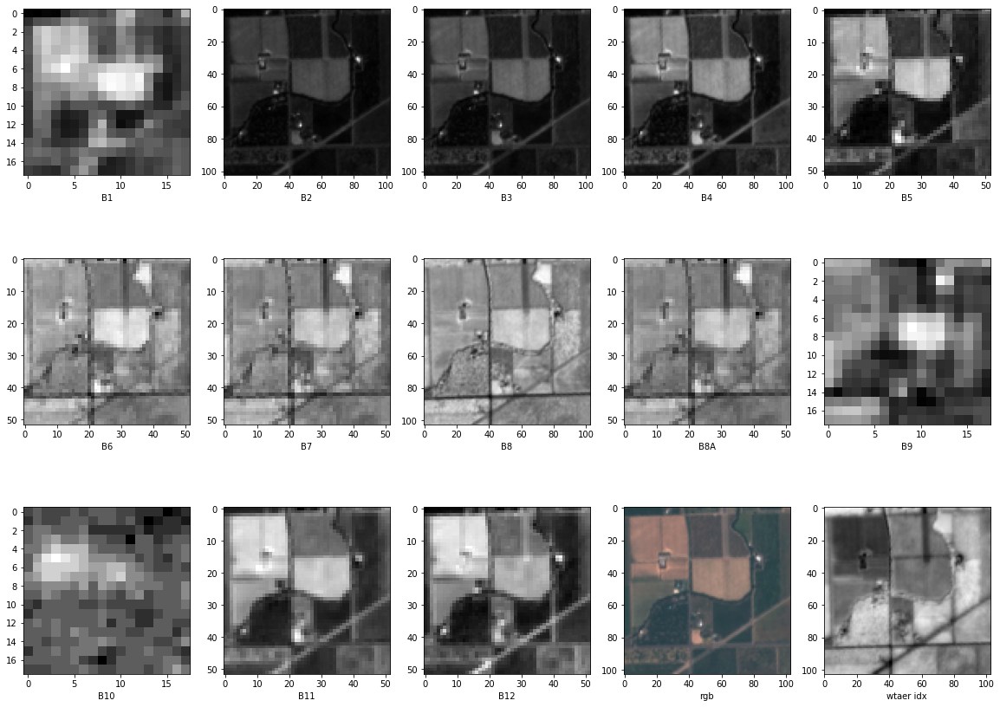

In [163]:
plot_all_bands(rand_uid)

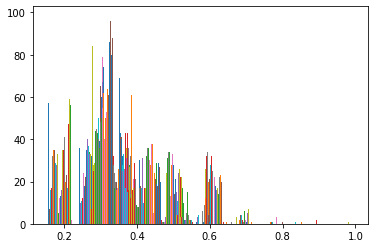

In [164]:
plt.hist(r/r.max());
plt.hist(g/g.max());
plt.hist(b/b.max());

In [114]:
metadata[metadata.uid == rand_uid]

,uid,latitude,longitude,date,split,region,severity,density
17739,tmyg,38.0609,-121.209,2017-05-16,train,west,4.0,3282317.0


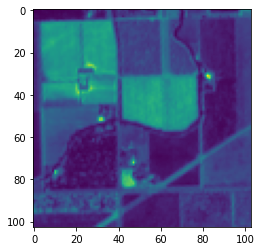

In [115]:
plt.imshow(r);

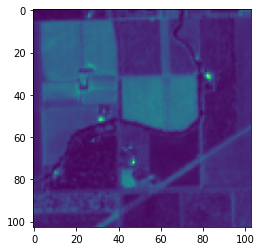

In [116]:
plt.imshow(g);

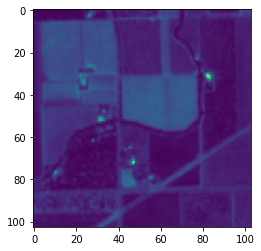

In [117]:
plt.imshow(b)

In [118]:
rgb.max()

3115

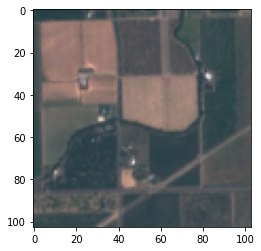

In [119]:
rgb = np.dstack((r, g, b))
plt.imshow(rgb/rgb.max())
#  can't see any water here!

In [84]:
#  Figure out the best way to normalize these images!!

In [140]:
arr_10 = cv2.resize(arr[11]/arr[11].max(), arr[7].shape, interpolation=cv2.INTER_CUBIC)
arr_10.shape

(103, 103)

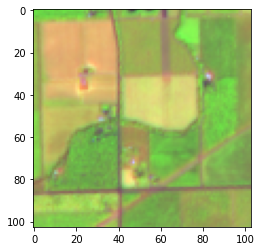

In [141]:
agri = np.dstack((arr_10, arr[7]/arr[7].max(), arr[1]/arr[1].max()))   # (B11, B8, B2)
plt.imshow(agri)

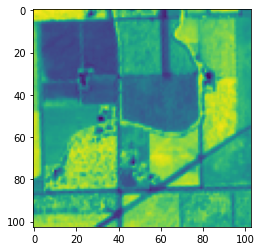

In [139]:
# veg index (B8-B4)/(B8+B4)

b8 = arr[7]
b4 = arr[3]

veg_idx = (b8 - b4)/(b8 + b4)
plt.imshow(veg_idx)

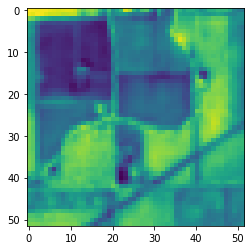

In [144]:
#  moisture idx (B8A-B11)/(B8A+B11)
b8a = arr[9]/arr[9].max()
b11 = arr[11]/arr[11].max()

b8a = cv2.resize(b8a, b11.shape)

mo_idx = (b8a - b11)/(b8a + b11)
plt.imshow(mo_idx)

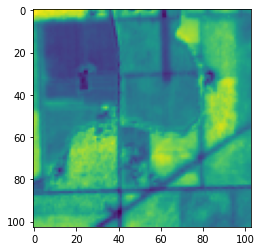

In [147]:
#  waterr index (nir and swir ndi)
b8 = arr[7]/arr[7].max() # nir
b12 = arr[12]/arr[12].max()  # swir

b12 = cv2.resize(b12, b8.shape)

water_idx = (b8 - b12)/(b8 + b12)
plt.imshow(water_idx)

In [167]:
#  these imgs seem okay but where is the water bruvvv!!!!
#  ---> maybe bigger imgs are better
#  ---> have to figure out on the way!
#  ---> try with sr imgaes

In [198]:
def get_rgb(arr):
    # get rgb bands from arr
    r, g, b = arr[3], arr[2], arr[1]
    rgb = np.dstack((r, g, b))
    # print(rgb.max())
    return rgb/rgb.max()

def get_img(uid):
     # load rand uid
    try:
        arr = joblib.load(sent_1 + f"/{uid}.npy")
    except:
        arr = joblib.load(sent_2 + f"/{uid}.npy")
    
    return arr

In [199]:
def plot_diff_imgs():
    # get rand img uid
    rand_uid = np.random.choice(imgs_found, (30,))
    
    fig, axis = plt.subplots(6, 5, figsize=(35,35))
    
    for idx, ax in enumerate(axis.ravel()):
        uid = rand_uid[idx]
        arr = get_img(uid)
        rgb = get_rgb(arr)
        ax.imshow(rgb)
        ax.set_xlabel(uid)
        

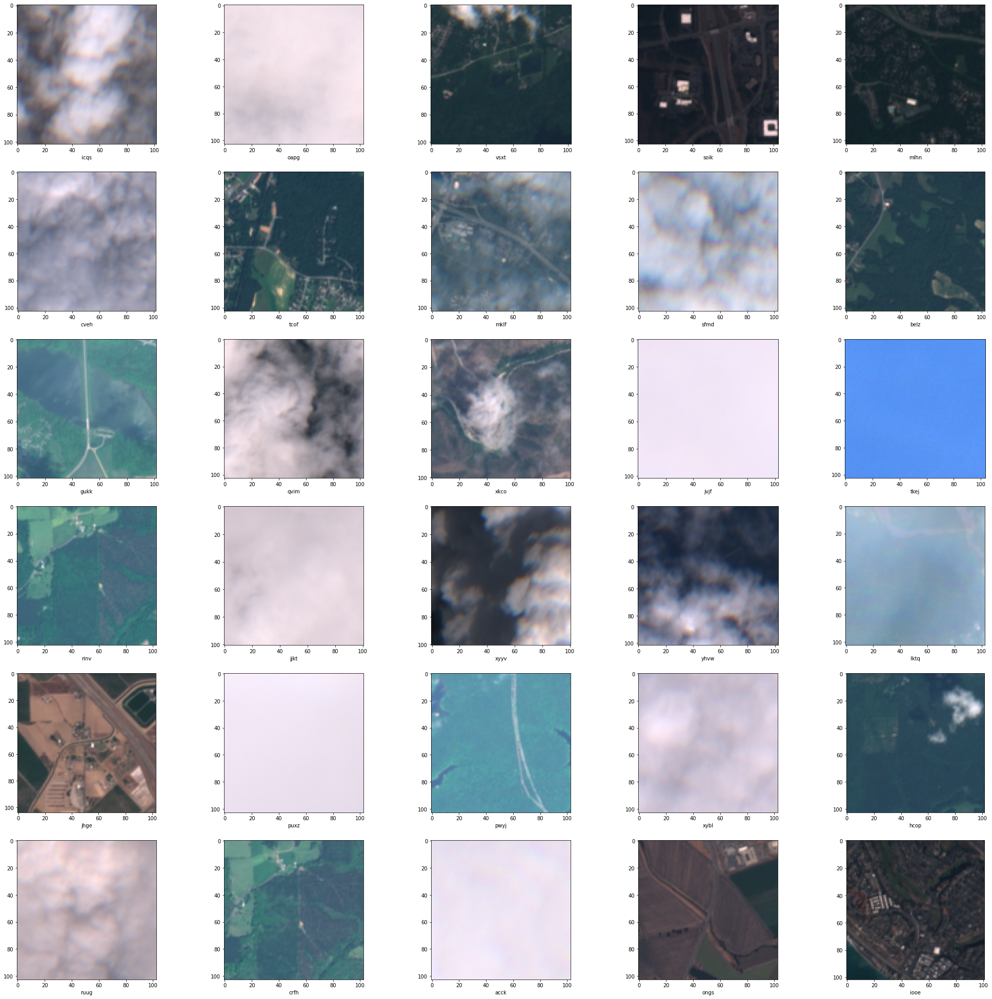

In [200]:
plot_diff_imgs()

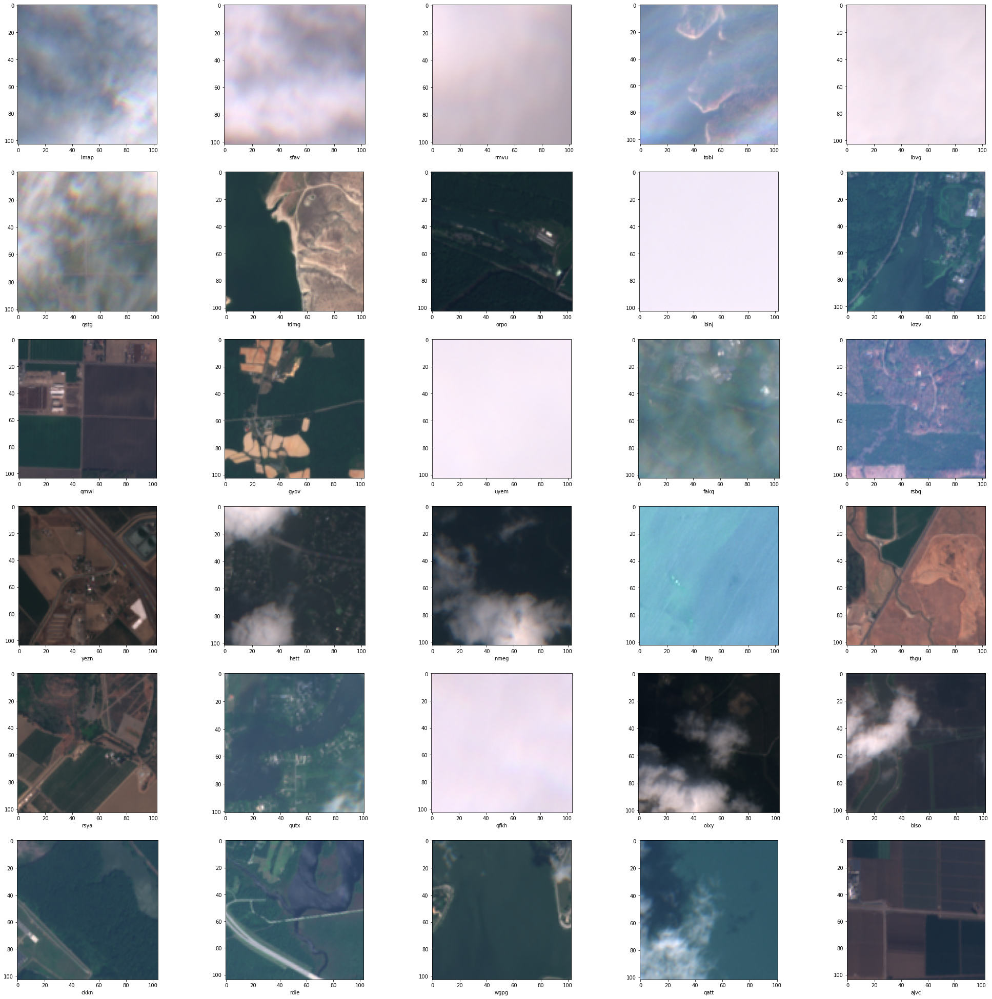

In [201]:
plot_diff_imgs()

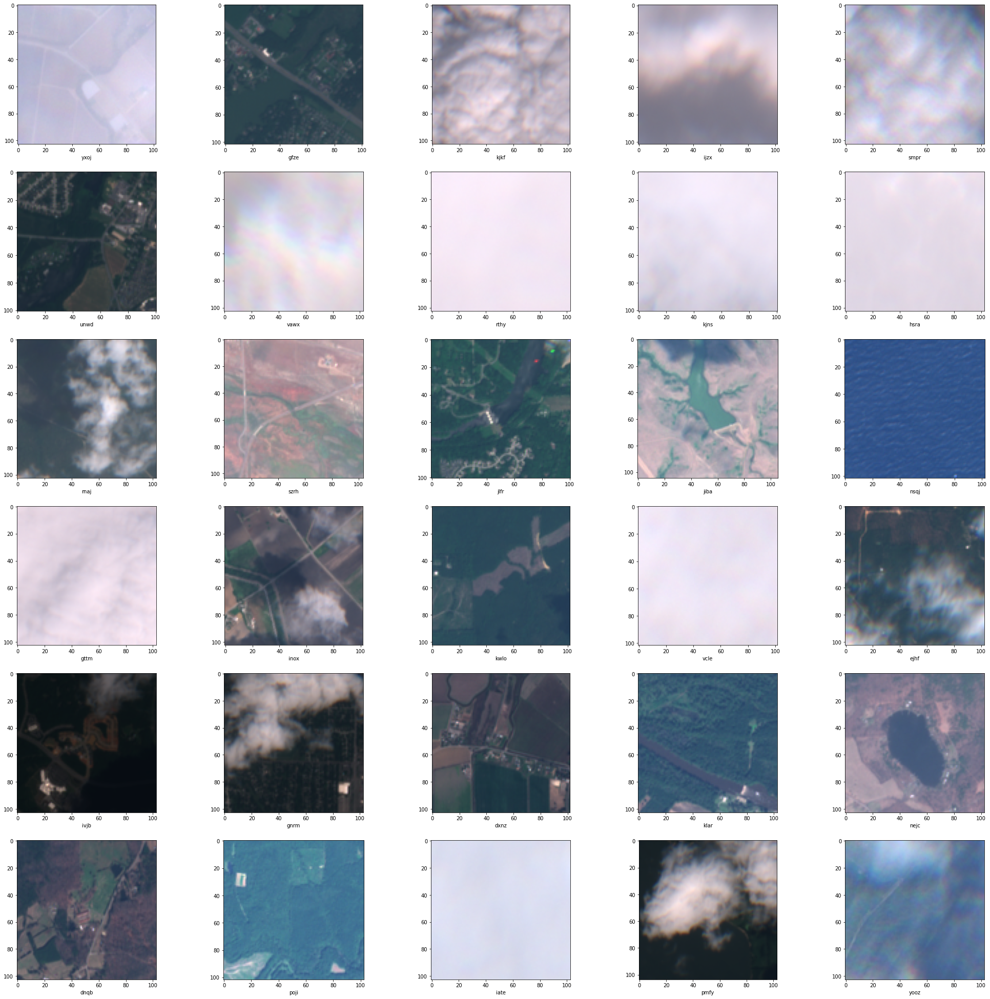

In [202]:
plot_diff_imgs()

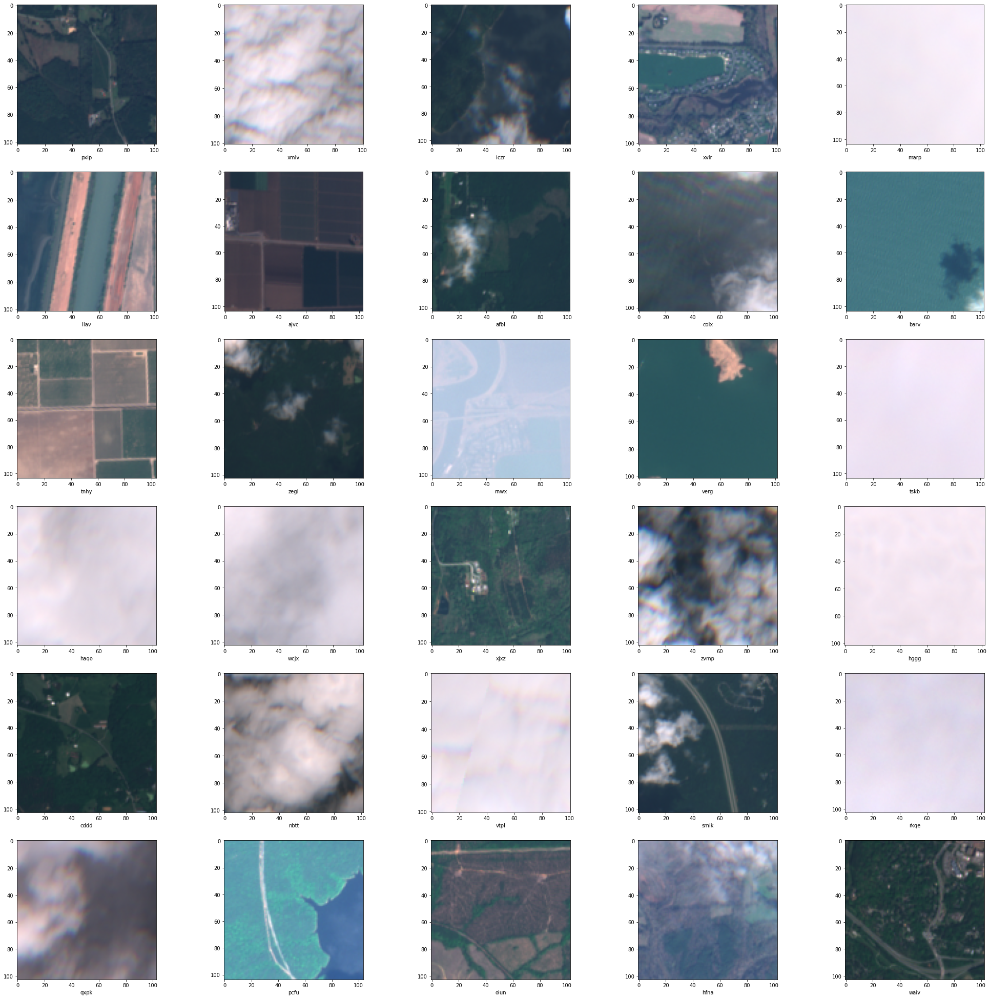

In [203]:
plot_diff_imgs()

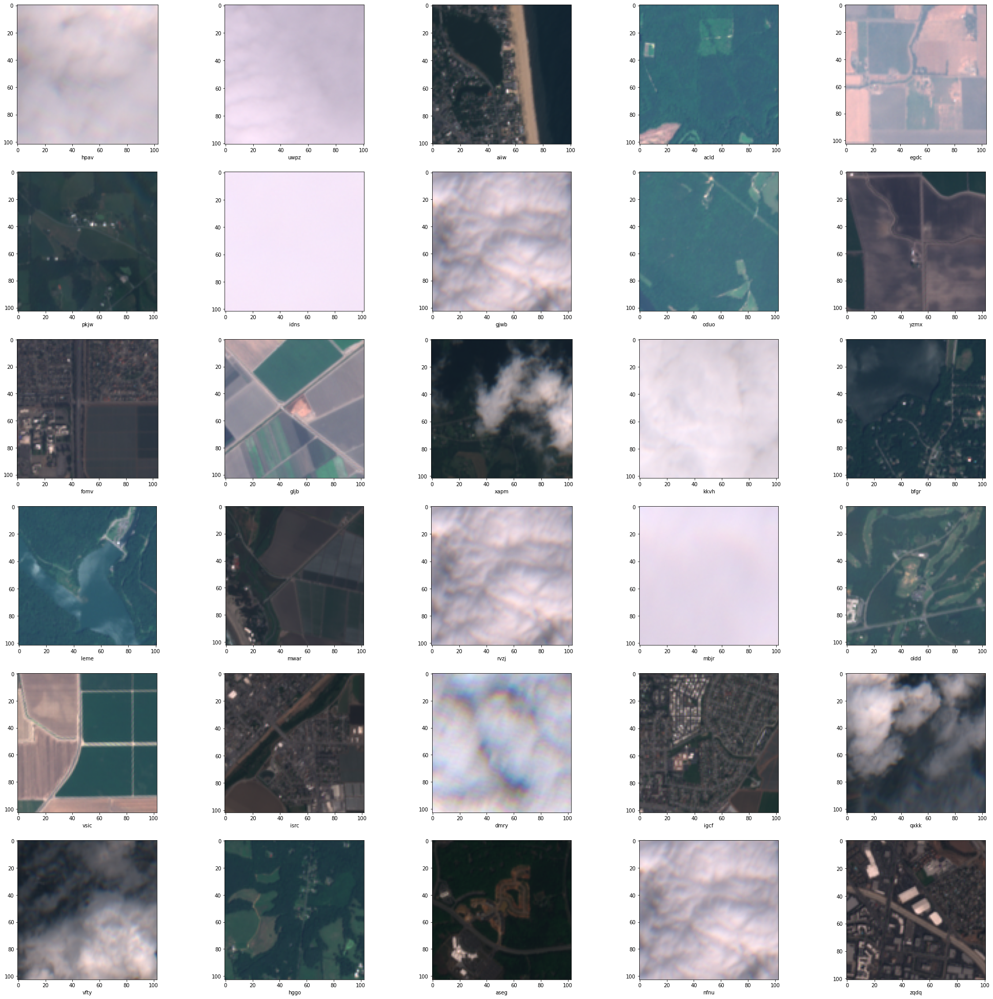

In [204]:
plot_diff_imgs()

In [205]:
#  have to find a way to remove thesee cloudss # nfnu is crazyyy! 
#  this makes me wonder if this is even the good approach what a nasty imgs